# Radio Comercial Music Danceability Prediction

<h2>Table of Contents</h2>
<ul>
    <li><a href="#Concepts">Concepts</a></li>
    <li><a href="#Imports">Imports</a></li>
    <li><a href="#EDA">EDA</a></li>
    <ul>
        <li><a href="#Statistics">Statistics</a></li>
        <li><a href="#Correlation">Correlation</a></li>
        <li><a href='#Train-Test-Split'>Train-Test Split</a></li>
    </ul>
    <li><a href="#Supervised-Prediction">Supervised Prediction</a></li>
    <li><a href="#Non-Supervised-Prediction">Non Supervised Prediction</a></li>
</ul>

<h2 id="Concepts">Concepts</h2>

> Dataset Link: https://www.kaggle.com/datasets/nunomvr/comercial5

The Comercial5 dataset has 5 years worth of music data (~480k entries) that played on Portuguese radio 'Radio Comercial'. The Spotify API was used to add features for the different songs

<h2 id="Imports">Imports</h2>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, StratifiedKFold, KFold
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error, root_mean_squared_error, r2_score, silhouette_score
from scipy.stats import normaltest, ttest_ind
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.cluster import KMeans

<h2 id="EDA">EDA</h2>

In [2]:
songs_normalize_df = pd.read_csv('data/untreated/songs_normalize.csv')
spotify_track_dataset_df = pd.read_csv('data/untreated/spotify-track-dataset.csv')
comercial_df = pd.read_csv('data/untreated/comercial.csv')

In [3]:
comercial_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 478103 entries, 0 to 478102
Data columns (total 19 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   artist             478103 non-null  object 
 1   song               478103 non-null  object 
 2   hour               478103 non-null  object 
 3   date               478103 non-null  object 
 4   popularity         474423 non-null  float64
 5   album_name         474423 non-null  object 
 6   release_date       474423 non-null  object 
 7   total_track_album  474423 non-null  float64
 8   danceability       474423 non-null  float64
 9   energy             474423 non-null  float64
 10  key                474423 non-null  float64
 11  loudness           474423 non-null  float64
 12  mode               474423 non-null  float64
 13  speechiness        474423 non-null  float64
 14  acousticness       474423 non-null  float64
 15  instrumentalness   474423 non-null  float64
 16  li

* artist: Name of the artist that produced the song

* song: Name of the song

* hour: Hour it played on the radio station

* date: Date when the song played on the radio station

* album_name: Name of the album where the song is from

* release_date: Date when the album was released

* total_track_album: Total number of tracks in the album where the song is from

* popularity: Value between [0,100] denoting the popularity, based on the total number of plays and how recent they are

* danceability: Value between [0,1] denoting how suitable a track is for dancing, based on a combination of musical elements

* energy: Value between [0,1] denoting the perceptual measure of intensity and activity (energetic, fast, loud)

* key: Value between [-1,11] denoting the key the song is in (integer to pitch mapping)

* loudness: Values usually between [-60,0] denoting the number of decibels

* mode: Binary value denoting the modality of the song

* speechiness: This feature related to the presence of spoken words in a song

* acousticness: Value between [0,1] denoting the confidence of whether or not the song is accoustic

* instrumentalness: Value between [0,1] denoting whether the song contains no vocals.

* liveness: This feature is related to the presence, or lack thereof, of audience in the recording.

* valence: Value between [0,1] denoting the musical positiveness conveyed by the song

* tempo: Value of the overall estimated tempo of the song in beats per minute

> We are going to make the 3 datasets compatible, so that we can work with the 3 of them

In [4]:
def missing_columns(df1, df2):
    missing_columns = []
    for column in df1.columns:
        if column not in df2.columns:
            missing_columns.append(column)
    return missing_columns

In [5]:
print('comercial_df, songs_normalize_df', missing_columns(comercial_df, songs_normalize_df))
print('songs_normalize_df, comercial_df', missing_columns(songs_normalize_df, comercial_df))
print('\n')
print('comercial_df, spotify_track_dataset_df', missing_columns(comercial_df, spotify_track_dataset_df))
print('spotify_track_dataset_df, comercial_df', missing_columns(spotify_track_dataset_df, comercial_df))

comercial_df, songs_normalize_df ['hour', 'date', 'album_name', 'release_date', 'total_track_album']
songs_normalize_df, comercial_df ['duration_ms', 'explicit', 'year', 'genre']


comercial_df, spotify_track_dataset_df ['artist', 'song', 'hour', 'date', 'release_date', 'total_track_album']
spotify_track_dataset_df, comercial_df ['Unnamed: 0', 'track_id', 'artists', 'track_name', 'duration_ms', 'explicit', 'time_signature', 'track_genre']


In [6]:
treated_songs_normalize_df = songs_normalize_df.drop(columns=['duration_ms', 'explicit', 'year', 'genre'])
treated_spotify_track_dataset_df = spotify_track_dataset_df.drop(columns=['Unnamed: 0', 'track_id', 'artists', 'track_name', 'duration_ms', 'explicit', 'time_signature', 'track_genre'])

In [7]:
print('treated_songs_normalize_df, treated_spotify_track_dataset_df', missing_columns(treated_songs_normalize_df, treated_spotify_track_dataset_df))
print('treated_spotify_track_dataset_df, treated_songs_normalize_df', missing_columns(treated_spotify_track_dataset_df, treated_songs_normalize_df))

treated_songs_normalize_df, treated_spotify_track_dataset_df ['artist', 'song']
treated_spotify_track_dataset_df, treated_songs_normalize_df ['album_name']


In [8]:
treated_songs_normalize_df.drop(columns=['artist', 'song'], inplace=True)
treated_spotify_track_dataset_df.drop(columns=['album_name'], inplace=True)

In [9]:
treated_train_df = pd.concat([treated_songs_normalize_df, treated_spotify_track_dataset_df], axis=0)

In [10]:
print('treated_train_df, comercial_df', missing_columns(treated_train_df, comercial_df))
print('comercial_df, treated_train_df', missing_columns(comercial_df, treated_train_df))

treated_train_df, comercial_df []
comercial_df, treated_train_df ['artist', 'song', 'hour', 'date', 'album_name', 'release_date', 'total_track_album']


In [11]:
treated_comercial_df = comercial_df.drop(columns=['artist', 'song', 'hour', 'date', 'album_name', 'release_date', 'total_track_album'])

> Now we are going to check for duplicates and null values and drop them

In [12]:
treated_train_df.shape, treated_comercial_df.shape

((116000, 12), (478103, 12))

In [13]:
treated_train_df.duplicated().sum(), treated_comercial_df.duplicated().sum()

(27425, 477502)

In [14]:
treated_train_df.drop_duplicates(inplace=True)
treated_comercial_df.drop_duplicates(inplace=True)

In [15]:
treated_train_df.head()

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,77,0.751,0.834,1,-5.444,0,0.0437,0.3000,0.000018,0.3550,0.894,95.053
1,79,0.434,0.897,0,-4.918,1,0.0488,0.0103,0.000000,0.6120,0.684,148.726
2,66,0.529,0.496,7,-9.007,1,0.0290,0.1730,0.000000,0.2510,0.278,136.859
3,78,0.551,0.913,0,-4.063,0,0.0466,0.0263,0.000013,0.3470,0.544,119.992
4,65,0.614,0.928,8,-4.806,0,0.0516,0.0408,0.001040,0.0845,0.879,172.656


In [16]:
treated_train_df.isna().sum() + treated_train_df.isnull().sum()

popularity          0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
dtype: int64

In [17]:
treated_comercial_df.isna().sum() + treated_comercial_df.isnull().sum()

popularity          2
danceability        2
energy              2
key                 2
loudness            2
mode                2
speechiness         2
acousticness        2
instrumentalness    2
liveness            2
valence             2
tempo               2
dtype: int64

In [18]:
treated_comercial_df.dropna(inplace=True)

In [19]:
treated_train_df.shape, treated_comercial_df.shape

((88575, 12), (600, 12))

In [20]:
treated_train_df.reset_index(inplace=True)
treated_train_df.drop(columns=['index'], inplace=True)

> We are now going to remove the values that are both into treted_comercial_df and treated_train_df so that they don't interfere with the metrics of the model

In [21]:
duplicated_values = pd.concat([treated_train_df, treated_comercial_df], axis=0).duplicated()
duplicated_index = duplicated_values[duplicated_values == True].index
duplicated_index

Index([    53,     76,     79,    134,    171,    173,    203,    246,    267,
          275, 356191, 356245, 356295, 356297, 356312, 356321, 356346, 356382,
       371867, 371963, 371967, 371969, 372088, 387695, 403638, 403828, 419850],
      dtype='int64')

In [23]:
# remove from duplicated_index the indexes that are higher than the highest index of treated_train_df
duplicated_index = duplicated_index[duplicated_index <= treated_train_df.index.max()]

In [24]:
# remove the duplicated indexes from treated_train_df
treated_train_df.drop(index=duplicated_index, inplace=True)

<h3 id="Statistics">Statistics</h3>

In [25]:
df_desc = treated_train_df.describe()
df_desc.loc['IQR'] = df_desc.loc['75%'] - df_desc.loc['25%']
df_desc

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,88565.000000,88565.000000,88565.000000,88565.000000,88565.000000,88565.000000,88565.000000,88565.000000,88565.000000,88565.000000,88565.000000,88565.000000
mean,35.150014,0.563572,0.638306,5.286400,-8.458406,0.631683,0.088474,0.322228,0.175218,0.217671,0.468445,122.169243
std,20.204916,0.176842,0.255599,3.558718,5.208927,0.482351,0.114135,0.337006,0.324954,0.195671,0.262416,30.013822
min,0.000000,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,21.000000,0.451000,0.463000,2.000000,-10.271000,0.000000,0.036100,0.015900,0.000000,0.098200,0.249000,99.620000
50%,35.000000,0.577000,0.682000,5.000000,-7.137000,1.000000,0.049300,0.178000,0.000065,0.133000,0.456000,122.028000
75%,50.000000,0.694000,0.856000,8.000000,-5.078000,1.000000,0.087200,0.613000,0.105000,0.280000,0.680000,140.088000
max,100.000000,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000
IQR,29.000000,0.243000,0.393000,6.000000,5.193000,1.000000,0.051100,0.597100,0.105000,0.181800,0.431000,40.468000


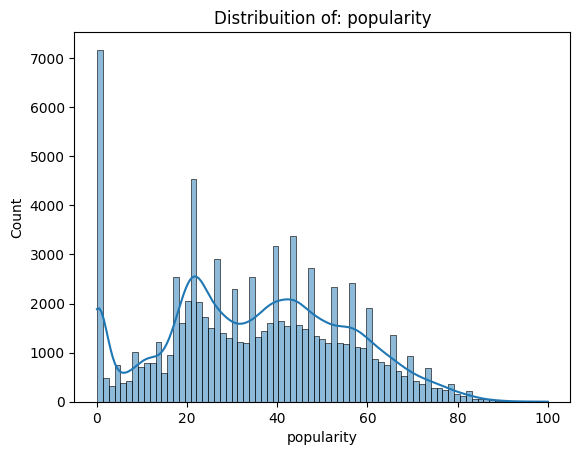

Distribution does not seem to be normal.


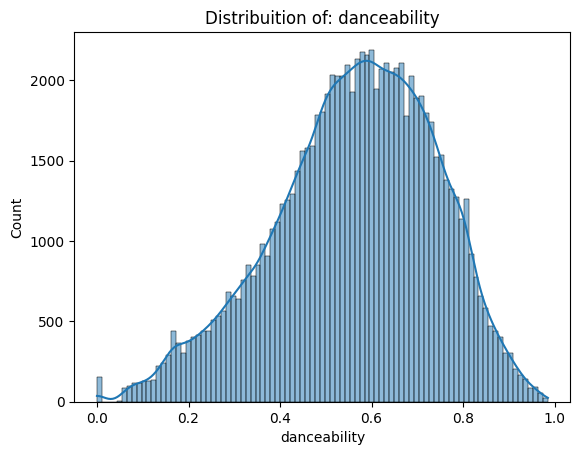

Distribution does not seem to be normal.


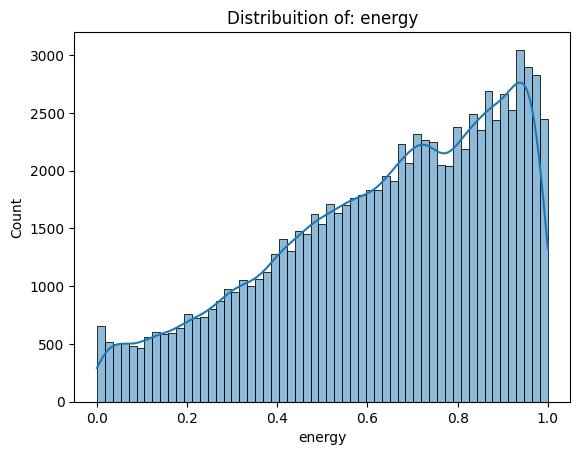

Distribution does not seem to be normal.


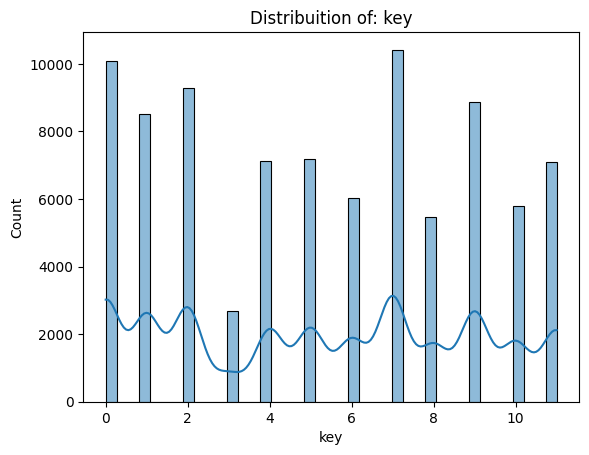

Distribution does not seem to be normal.


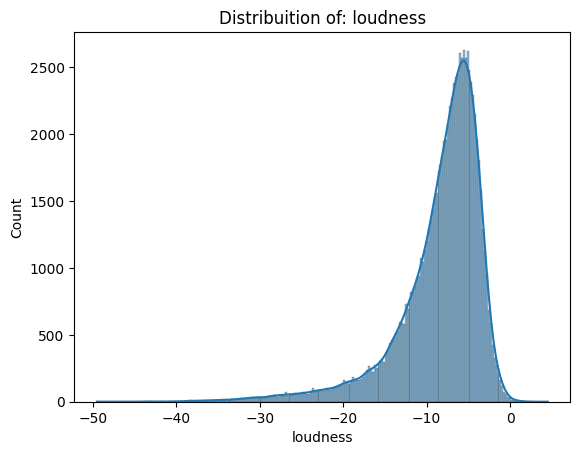

Distribution does not seem to be normal.


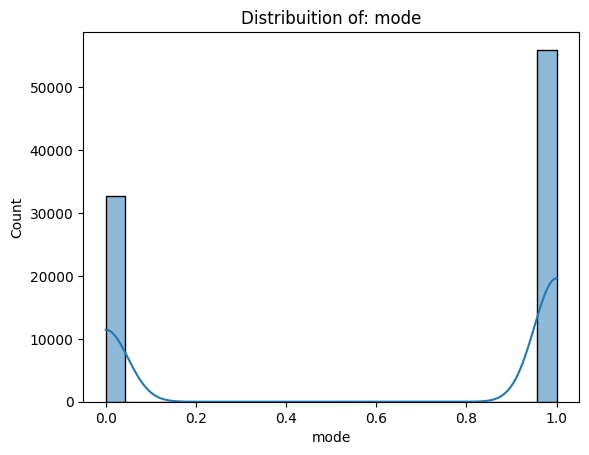

Distribution does not seem to be normal.


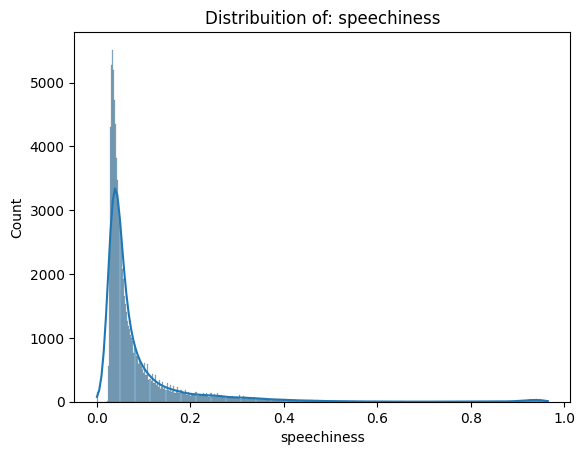

Distribution does not seem to be normal.


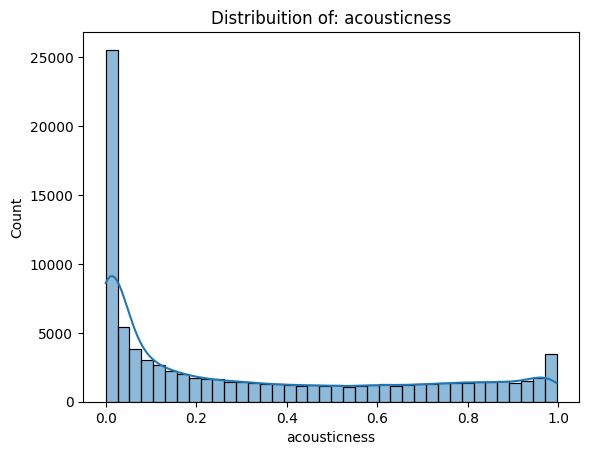

Distribution does not seem to be normal.


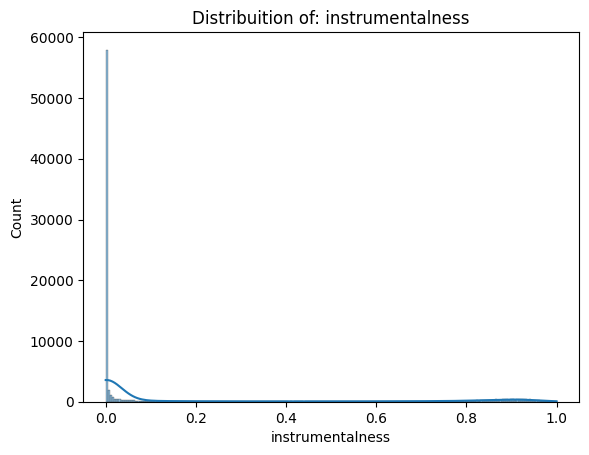

Distribution does not seem to be normal.


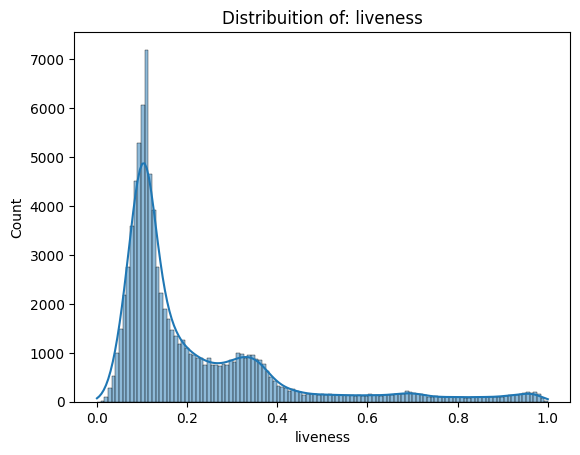

Distribution does not seem to be normal.


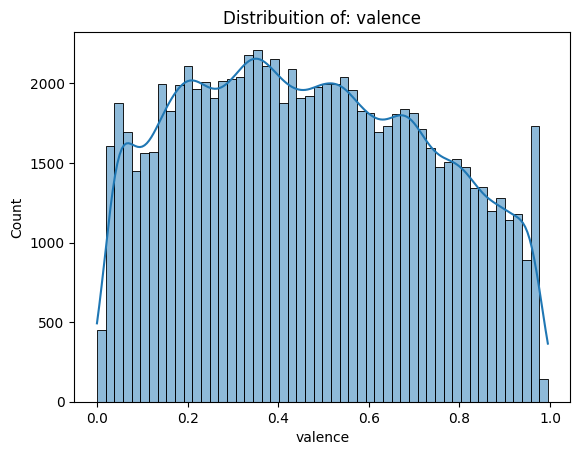

Distribution does not seem to be normal.


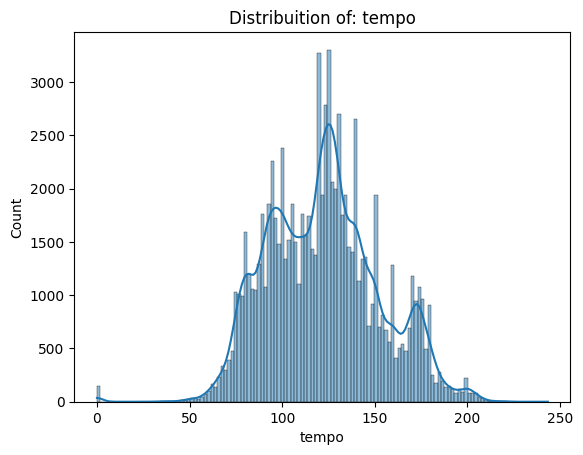

Distribution does not seem to be normal.


In [26]:
for column in treated_train_df:
    test_stat, p = normaltest(treated_train_df[column])
    
    sns.histplot(data = treated_train_df,
                 x = column,
                 kde = True)
    plt.title(f"Distribuition of: {column}")
    plt.show()
    if p < 0.05:
        print("Distribution does not seem to be normal.")
    else:
        print("Distribution does seems to be normal.")

> As no column seems to follow a normal distribuition we are going to use the spearman correlation

In [27]:
for column in treated_train_df:
    
    Q1 = treated_train_df[column].quantile(0.25)
    Q3 = treated_train_df[column].quantile(0.75)
    IQR = Q3 - Q1
    
    faixa_de_tolerancia = 1.5
    lower_bound = Q1 - faixa_de_tolerancia * IQR
    upper_bound = Q3 + faixa_de_tolerancia * IQR
    
    aux_outliers = treated_train_df[column].apply(lambda x : x < lower_bound or x > upper_bound)
    
    outliers_indices = aux_outliers[aux_outliers].index.tolist()
    
    if len(outliers_indices) >= 1:
        print(f'The column {column} has {len(outliers_indices)} outliers!')
        print("\n Its indices are:\n")
        print(outliers_indices)
    else:
        print(f'The column {column} has no outliers!')
        
    print()
    print('='*80)

The column popularity has 15 outliers!

 Its indices are:

[19948, 19949, 19956, 45785, 56437, 56439, 56440, 56562, 56591, 56616, 65080, 66670, 66691, 70711, 70714]

The column danceability has 460 outliers!

 Its indices are:

[5156, 5166, 5172, 5206, 5254, 5342, 5351, 5445, 5572, 5573, 5586, 5592, 5682, 5723, 5729, 5732, 5782, 5817, 5837, 5913, 5942, 5954, 5987, 6046, 6063, 6803, 7152, 7206, 7272, 7289, 7376, 7378, 7424, 7427, 7434, 7447, 7473, 7516, 7525, 7585, 7590, 7606, 7672, 7675, 7719, 7755, 7777, 7812, 7819, 7864, 7900, 7977, 7983, 8045, 11854, 12055, 12160, 12252, 12295, 12562, 16517, 16685, 16922, 16956, 17001, 17577, 21927, 22126, 22360, 25515, 25738, 25803, 25886, 26065, 26076, 35279, 35352, 35395, 35405, 35409, 35414, 35439, 35441, 35442, 35447, 35453, 35454, 35456, 35468, 35484, 35552, 35605, 35876, 35949, 37623, 37637, 37643, 37683, 37708, 37803, 37833, 38012, 38053, 40604, 40654, 40663, 40704, 40706, 40809, 40847, 40849, 47191, 47525, 47529, 47712, 47878, 47886, 50322,

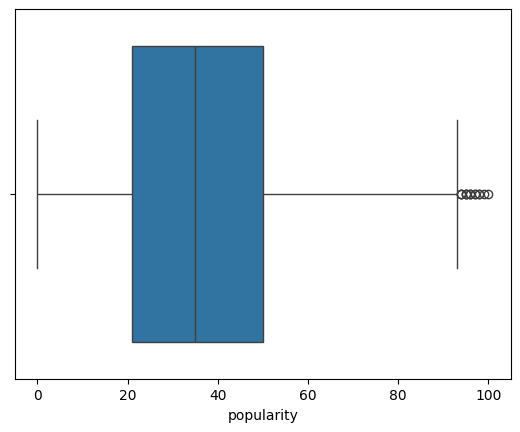

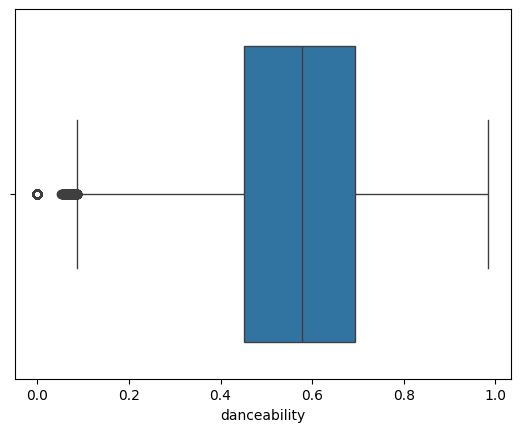

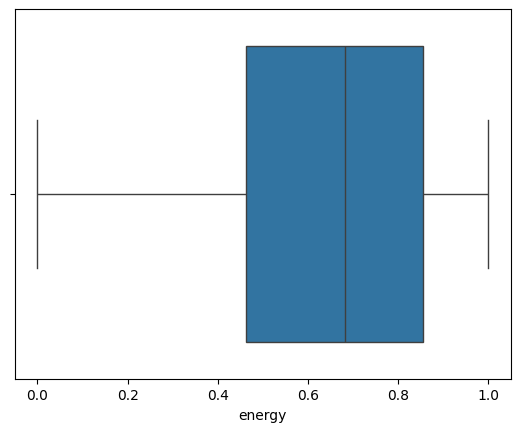

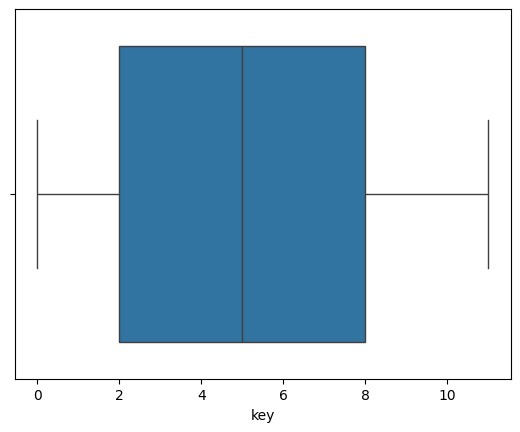

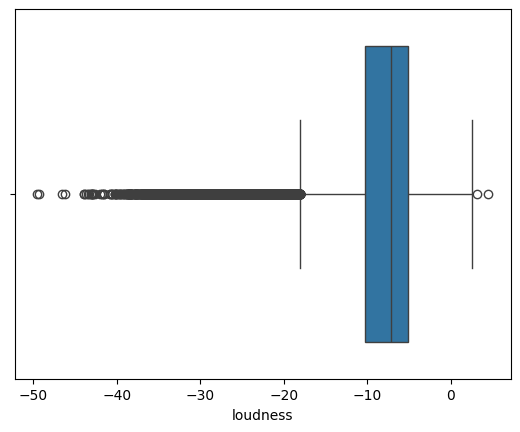

...

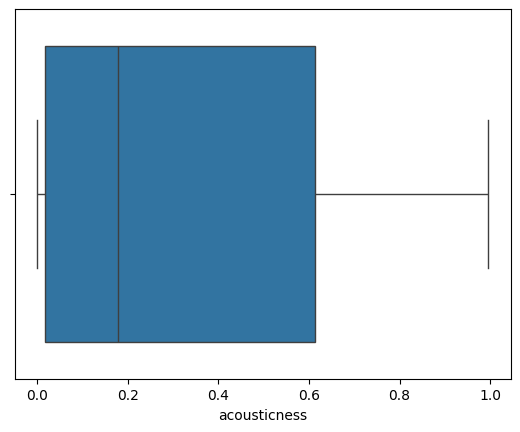

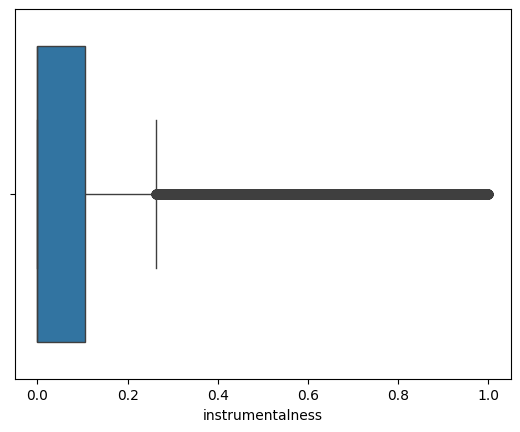

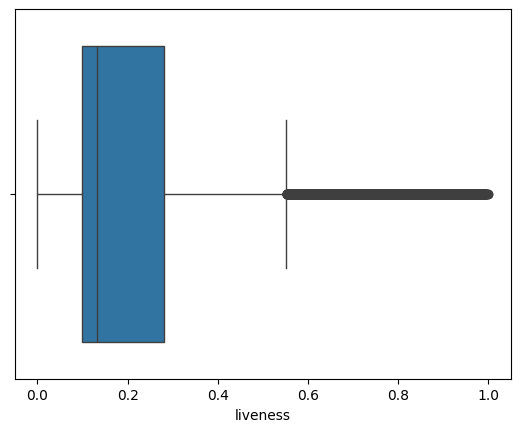

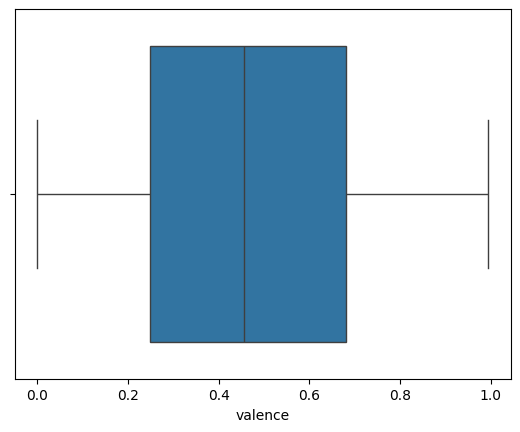

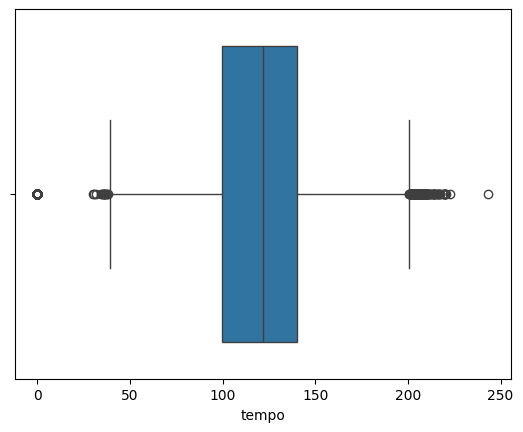

In [28]:
for column in treated_train_df:
    sns.boxplot(data=treated_train_df, x=column)
    plt.show()

> As these outliers come from real values and not from contamination in the data, we are going to keep them

<h3 id="Correlation">Correlation</h3>

<Axes: >

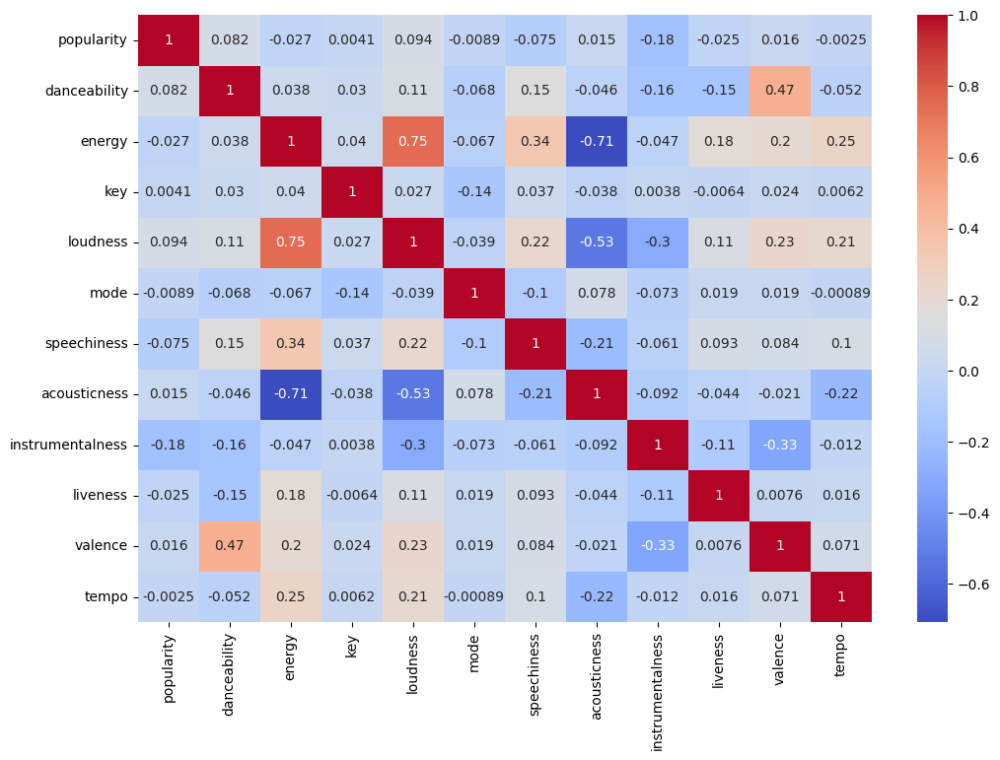

In [31]:
corr = treated_train_df.corr(method='spearman')
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm')

> The danceability column seems to have  a good correlation with the valence, which makes sense, as in the music field valence represents the emotional quality of a piece of music, describing how positive or negative the emotions it conveys are, and happier songs are going to be more prone to dancing.

<h3 id="Train-Test-Split">Train-Test Split</h3>

In [32]:
X = treated_train_df.drop(columns='danceability')
y = treated_train_df['danceability']

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [34]:
df_train = pd.concat([y_train, X_train], axis=1)
df_test = pd.concat([y_test, X_test], axis=1)
df_train

,danceability,popularity,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
82275,0.654,40,0.8490,4,-5.033,0,0.0980,0.0919,0.000000,0.3260,0.763,119.961
32077,0.411,44,0.5640,1,-7.516,0,0.0339,0.6540,0.000000,0.3140,0.639,141.662
48711,0.323,43,0.4170,1,-18.764,1,0.2990,0.8790,0.863000,0.3490,0.182,180.256
78294,0.847,36,0.5470,6,-7.736,0,0.0372,0.4610,0.362000,0.0721,0.938,97.577
72568,0.585,22,0.9570,7,-6.025,1,0.0943,0.0171,0.000000,0.2160,0.604,92.111
...,...,...,...,...,...,...,...,...,...,...,...,...
6275,0.406,53,0.0277,2,-28.568,0,0.0542,0.9870,0.745000,0.0788,0.189,147.966
54896,0.654,47,0.6970,1,-5.242,0,0.0974,0.4410,0.000033,0.1260,0.556,173.973
76830,0.528,29,0.4880,8,-11.161,1,0.1720,0.8010,0.000000,0.3480,0.708,124.219
870,0.672,74,0.8200,11,-4.456,1,0.0459,0.0368,0.000188,0.1840,0.438,120.005


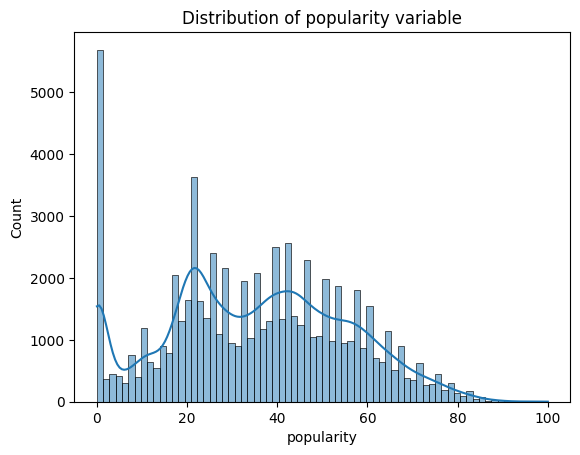

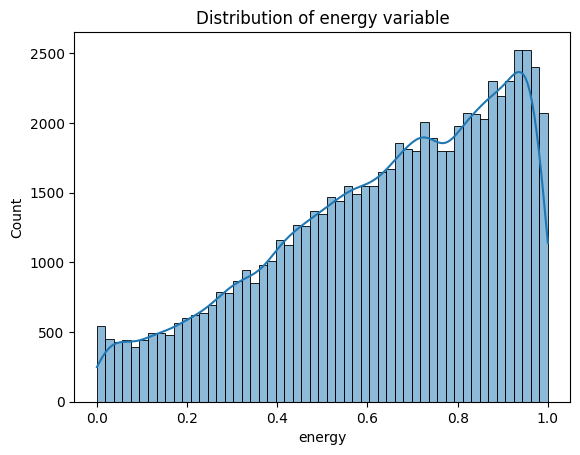

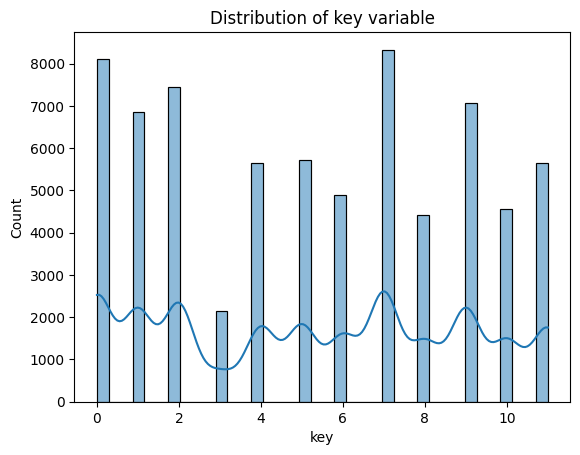

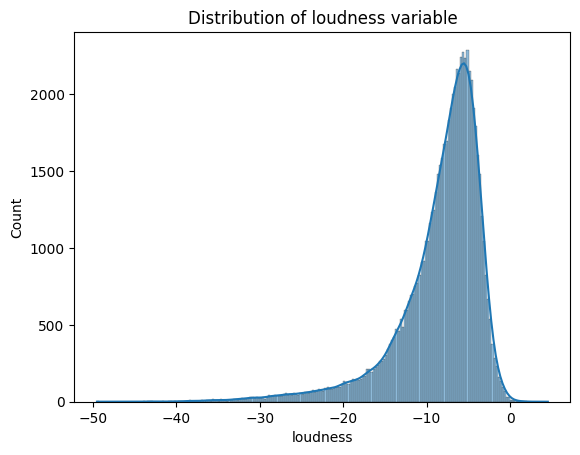

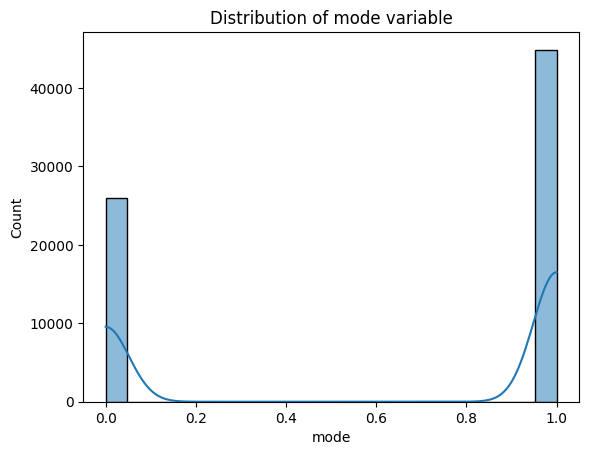

...

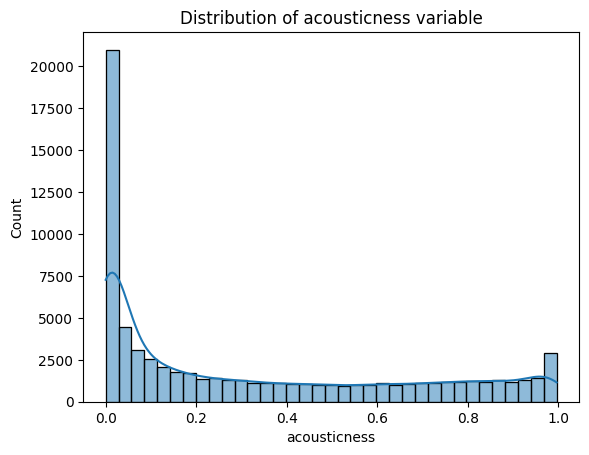

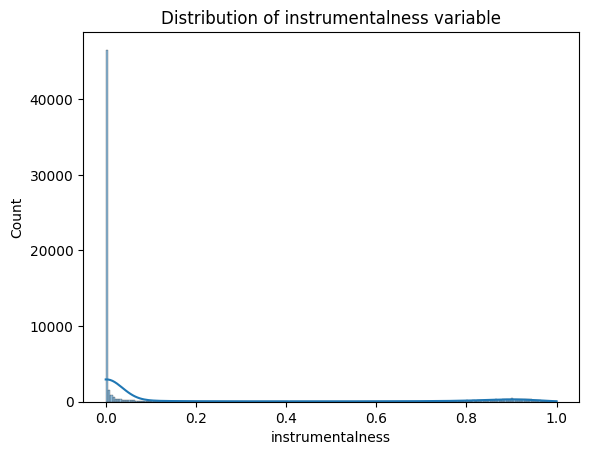

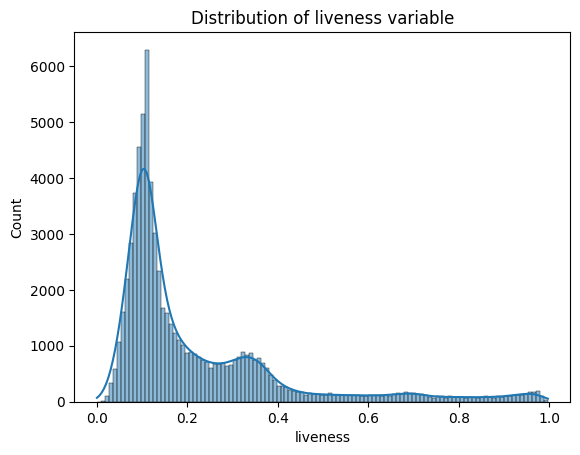

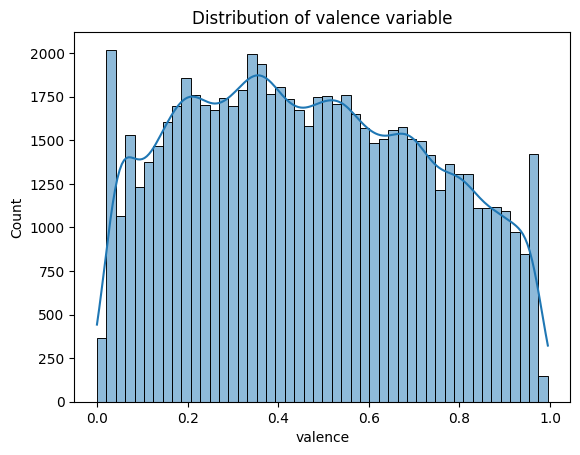

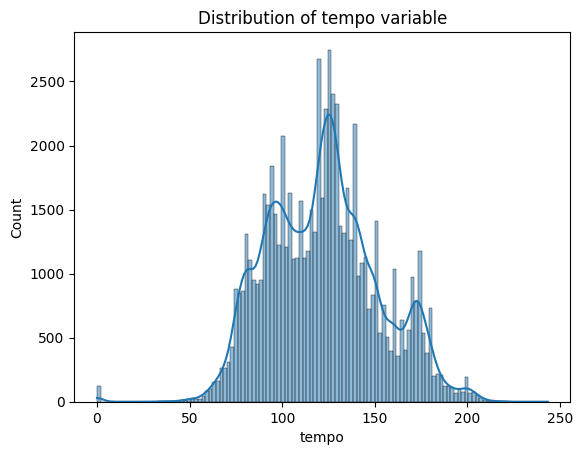

In [35]:
for column in X_train:
    sns.histplot(data=X_train, x=column, kde=True).set_title(f'Distribution of {column} variable')
    plt.show()

In [37]:
desc = X_train.describe()
desc.loc['IQR'] = desc.loc['75%'] - desc.loc['25%']
desc

,popularity,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,70852.000000,70852.000000,70852.000000,70852.000000,70852.000000,70852.000000,70852.000000,70852.000000,70852.000000,70852.000000,70852.000000
mean,35.164103,0.638358,5.274798,-8.463072,0.633405,0.088266,0.321687,0.175050,0.217825,0.468367,122.230933
std,20.194594,0.255285,3.557891,5.212734,0.481878,0.113998,0.336852,0.324841,0.195666,0.262568,30.024320
min,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,21.000000,0.462000,2.000000,-10.269000,0.000000,0.036100,0.015800,0.000000,0.098300,0.249000,99.657250
50%,35.000000,0.681000,5.000000,-7.135000,1.000000,0.049300,0.178000,0.000065,0.133000,0.456000,122.066000
75%,50.000000,0.855000,8.000000,-5.081750,1.000000,0.086825,0.612000,0.105000,0.281000,0.681000,140.108000
max,100.000000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,0.997000,0.995000,243.372000
IQR,29.000000,0.393000,6.000000,5.187250,1.000000,0.050725,0.596200,0.105000,0.182700,0.432000,40.450750


> This description seems very similar to the one done in the begining of this notebook, it means that the split was done in a way that didn't modify the distribution of data. This is good as it will represent well the data we have.

<h2 id="Supervised-Prediction">Supervised Prediction</h2>

> We'll try to predict the danceability column with a regression model

In [38]:
pipe_logit = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())
])

pipe_logit.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('model', LinearRegression())])

In [39]:
def reg_metrics(modelo, X, y_true, label, print_metrics=False):

    print(f"\{label} avaliation metrics:\n")
    
    y_pred = modelo.predict(X)
    
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = root_mean_squared_error(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)

    if print_metrics:
        print(f"R2 Score: {r2}")
        print(f"Mean Absolute Error: {mae}")
        print(f"Mean Squared Error: {mse}")
        print(f"Root Mean Squared Error: {rmse}")
        print(f"Mean Absolute Percentage Error: {mape}")
    
    return {'r2': r2, 'mae': mae, 'mse': mse, 'rmse': rmse, 'mape': mape}

In [40]:
def modeling_cicle_experiments(dict_pipes, 
                                    print_metrics=False, print_progress=False):
    
    resultado_experimentos = {"estimator" : [],
                              "rmse_train" : [],
                              "rmse_test" : []}

    for label, pipe in dict_pipes.items():

        if print_progress:
            print("\n")
            print("="*80)
            print(f"Estimator: {label}".center(80))
            print("(with default hyperparameters)".center(80))
            print("="*80)
            print("\n")

        # ================================

        pipe.fit(X_train, y_train)

        train_metrics_dict = reg_metrics(pipe, X_train, y_train, "train", 
                                                      print_metrics=print_metrics)

        if print_progress:
            print("#"*80)

        test_metrics_dict = reg_metrics(pipe, X_test, y_test, "test", 
                                                     print_metrics=print_metrics)

        # Get the metrics to save
        rmse_train = train_metrics_dict["rmse"]
        rmse_test = test_metrics_dict["rmse"]

        # ================================
        # Keeping the experiment results
        resultado_experimentos["estimator"].append(label)
        resultado_experimentos["rmse_train"].append(rmse_train)
        resultado_experimentos["rmse_test"].append(rmse_test)


    df_results = pd.DataFrame(resultado_experimentos)

    df_results["gap"] = (df_results["rmse_train"] - df_results["rmse_test"]).apply(lambda x: x if x > 0 else np.inf)

    df_results = df_results.sort_values("rmse_test", ascending=False).sort_values("gap")

    return df_results

In [41]:
pipe_logit = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())
])

pipe_rf = Pipeline([
    ('scaler', StandardScaler()),
    ('model', RandomForestRegressor(random_state=42))
])

pipe_dt = Pipeline([
    ('scaler', StandardScaler()),
    ('model', DecisionTreeRegressor(random_state=42))
])

pipe_xgb = Pipeline([
    ('scaler', StandardScaler()),
    ('model', XGBRegressor(random_state=42))
])

pipe_lgbm = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LGBMRegressor(random_state=42))
])

dict_pipes = {  "logit": pipe_logit,
                "random_forest": pipe_rf,
                "dt": pipe_dt,
                "xgb": pipe_xgb,
                "lgbm": pipe_lgbm
            }

df_results = modeling_cicle_experiments(dict_pipes, print_metrics=True, print_progress=True)

df_results



                                Estimator: logit                                
                         (with default hyperparameters)                         


\train avaliation metrics:

R2 Score: 0.3504939960475133
Mean Absolute Error: 0.11389258668273766
Mean Squared Error: 0.020363195317455906
Root Mean Squared Error: 0.14269966824578081
Mean Absolute Percentage Error: 3125505936129.1445
################################################################################
\test avaliation metrics:

R2 Score: 0.3462313980365561
Mean Absolute Error: 0.11312371292856331
Mean Squared Error: 0.0202386272814808
Root Mean Squared Error: 0.14226252943583143
Mean Absolute Percentage Error: 3262825100446.2637


                            Estimator: random_forest                            
                         (with default hyperparameters)                         


\train avaliation metrics:

R2 Score: 0.947571343405129
Mean Absolute Error: 0.03101443890080732
Mean Squared Error: 0.0

,estimator,rmse_train,rmse_test,gap
0,logit,1.426997e-01,0.142263,0.000437
2,dt,3.980191e-18,0.154774,inf
4,lgbm,1.059266e-01,0.110296,inf
1,random_forest,4.054299e-02,0.108512,inf
3,xgb,9.474158e-02,0.108098,inf


> Although the random forest estimator had a slightly better result, we are going to use the xgboost as it is less prone to overfiting

In [42]:
pipe_xgb = Pipeline([
    ('scaler', StandardScaler()),
    ('model', XGBRegressor(n_jobs=-1, random_state=42))
])

param_grid = {
    'model__n_estimators': np.arange(100, 1000, 100),
    'model__max_depth': np.arange(3, 10, 1),
    'model__learning_rate': np.arange(0.01, 0.1, 0.01),
    'model__subsample': np.arange(0.5, 1, 0.1),
    'model__colsample_bytree': np.arange(0.5, 1, 0.1),
}

splitter = KFold(n_splits=5, shuffle=True, random_state=42)

rand_grid_xgb = RandomizedSearchCV(pipe_xgb, param_distributions=param_grid, n_iter=20, cv=splitter, scoring='neg_root_mean_squared_error', random_state=42, n_jobs=-1)

rand_grid_xgb.fit(X_train, y_train)

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                             ('model',
                                              XGBRegressor(base_score=None,
                                                           booster=None,
                                                           callbacks=None,
                                                           colsample_bylevel=None,
                                                           colsample_bynode=None,
                                                           colsample_bytree=None,
                                                           device=None,
                                                           early_stopping_rounds=None,
                                                           enable_categorical=False,
                                                           eval_metric=None,
                                                           feature_types...
                   param_distributions={'model__colsample_bytree': array([0.5, 0.6, 0.7, 0.8, 0.9]),
                                        'model__learning_rate': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09]),
                                        'model__max_depth': array([3, 4, 5, 6, 7, 8, 9]),
                                        'model__n_estimators': array([100, 200, 300, 400, 500, 600, 700, 800, 900]),
                                        'model__subsample': array([0.5, 0.6, 0.7, 0.8, 0.9])},
                   random_state=42, scoring='neg_root_mean_squared_error')

In [43]:
rand_grid_xgb.best_params_

{'model__subsample': 0.8999999999999999,
 'model__n_estimators': 800,
 'model__max_depth': 9,
 'model__learning_rate': 0.02,
 'model__colsample_bytree': 0.8999999999999999}

In [44]:
pipe_xgb = Pipeline([("scaler", StandardScaler()),
                    ("xgb", XGBRegressor(random_state=42))]).set_params(**{ 'xgb__subsample': 0.8999999999999999,
                                                                            'xgb__n_estimators': 800,
                                                                            'xgb__max_depth': 9,
                                                                            'xgb__learning_rate': 0.02,
                                                                            'xgb__colsample_bytree': 0.8999999999999999})

pipe_xgb.fit(X_train, y_train)

# ================================

reg_metrics(pipe_xgb, X_train, y_train, "train", print_metrics=True)
print("#"*80)
reg_metrics(pipe_xgb, X_test, y_test, "test", print_metrics=True)

\train avaliation metrics:

R2 Score: 0.8222539072780654
Mean Absolute Error: 0.05735530542136177
Mean Squared Error: 0.00557266350270129
Root Mean Squared Error: 0.07465027463245724
Mean Absolute Percentage Error: 51407652148.89143
################################################################################
\test avaliation metrics:

R2 Score: 0.6463914525701502
Mean Absolute Error: 0.081444704827629
Mean Squared Error: 0.010946612568247381
Root Mean Squared Error: 0.10462606065530414
Mean Absolute Percentage Error: 107036650337.37766


{'r2': 0.6463914525701502,
 'mae': 0.081444704827629,
 'mse': 0.010946612568247381,
 'rmse': 0.10462606065530414,
 'mape': 107036650337.37766}

In [45]:
X_treated_comercial_df = treated_comercial_df.drop(columns='danceability')
y_treated_comercial_df = treated_comercial_df['danceability']

comercial_prediction = pipe_xgb.predict(X_treated_comercial_df)
result = pd.DataFrame({'danceability_prediction': comercial_prediction, 'danceability_real': y_treated_comercial_df})
result

,danceability_prediction,danceability_real
0,0.577061,0.596
1,0.515235,0.460
2,0.570118,0.473
3,0.465514,0.528
4,0.669465,0.734
...,...,...
419948,0.410687,0.407
419949,0.457340,0.620
419950,0.519579,0.587
419951,0.381745,0.406


In [46]:
reg_metrics(pipe_xgb, X_treated_comercial_df, y_treated_comercial_df, "comercial", print_metrics=True)

\comercial avaliation metrics:

R2 Score: 0.5357324286033918
Mean Absolute Error: 0.07150866858243941
Mean Squared Error: 0.008911468210163163
Root Mean Squared Error: 0.09440057314531074
Mean Absolute Percentage Error: 0.1362936390485502


{'r2': 0.5357324286033918,
 'mae': 0.07150866858243941,
 'mse': 0.008911468210163163,
 'rmse': 0.09440057314531074,
 'mape': 0.1362936390485502}

> As we can see the model was able to predict with a good acuracy the values of danceability in the comercial dataset, and would be able to do so with new data.

<h2 id="Non-Supervised-Prediction">Non Supervised Prediction</h2>

> Now we'll try to find groups in the data using a non supervised model

In [50]:
def inertia_calc(X, k_list, plot=True):
    inertia_list = []
    
    X_df = pd.DataFrame(X, columns= [f'X{i+1}' for i in range(X.shape[1])])
    
    for k in k_list:
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(X)
        
        clusters_labels = kmeans.labels_
        
        inertia = kmeans.inertia_
        inertia_list.append(inertia)
        
        labels_series = pd.Series(clusters_labels, name='label')
        df_result = pd.concat([X_df, labels_series], axis=1)
        
        if plot and X.shape[1] == 2:
            print(f'\Inertia for clustering with k = {k} : {inertia}')
            
            sns.jointplot(data = df_result,
                        x = 'X1',
                        y = 'X2',
                        hue = 'label')
            plt.show()
    return inertia_list

In [51]:
def plot_elbow(k_list, inertia_list):
    plt.figure(figsize=(8, 5))
    
    plt.title('Elbow Method')
    plt.plot(k_list, inertia_list, marker='o')
    
    plt.xlabel('k')
    plt.ylabel('Inertia (WCSS)')
    
    plt.show()

In [52]:
def silhouette_calc(X, k_list, plot=True):
    silhouette_list = []
    
    X_df = pd.DataFrame(X, columns= [f'X{i+1}' for i in range(X.shape[1])])
    
    for k in k_list:
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(X)
        
        labels_clusters = kmeans.labels_
        
        silhouette = silhouette_score(X, labels_clusters)
        silhouette_list.append(silhouette)
        
        labels_series = pd.Series(labels_clusters, name='label')
        df_result = pd.concat([X_df, labels_series], axis=1)
        
        if plot and X.shape[1] == 2:
            print(f'\silhouette for clustering with k = {k} : {silhouette}')
            
            sns.jointplot(data = df_result,
                        x = 'X1',
                        y = 'X2',
                        hue = 'label')
            plt.show()
    return silhouette_list

In [53]:
def plot_silhouette(X, k_list):
    
    silhouette_list = silhouette_calc(X, k_list, plot=False)

    plt.figure(figsize=(8, 5))

    plt.title("Silhouette Method")

    plt.plot(k_list, silhouette_list, marker="o")

    plt.xlabel("k (# of clusters)")
    plt.ylabel("Mean silhouette score")

    plt.show()

> We are going to use the elbow method together with the silhouette method to find the right ammount of clusters.

In [55]:
k_list = range(2,9)

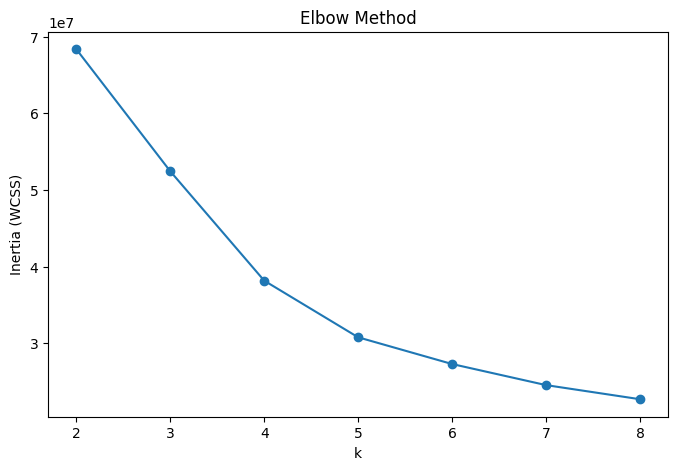

In [56]:
inertias = inertia_calc(treated_train_df, k_list)
plot_elbow(k_list, inertias)

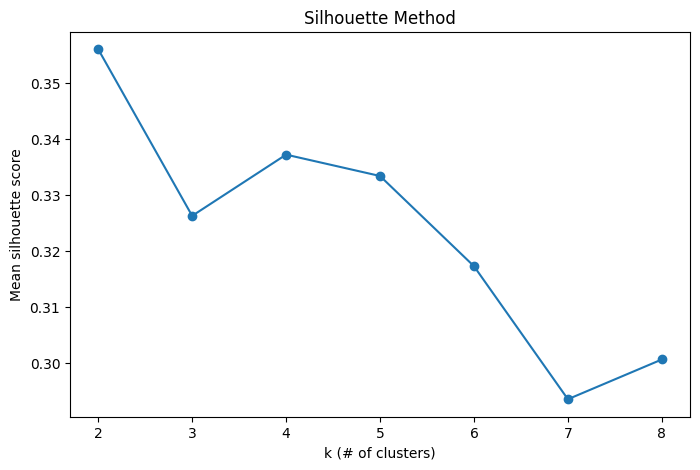

In [57]:
plot_silhouette(treated_train_df, k_list)

> As we can see with smaller variation of inertia in the elbow method together with the higher value in the silhouette method, the right ammount of clusters seems to be 4

> We are going to use the KMeans estimator as it works well with data that doesn't seems to have clear groups.

In [60]:
k_means = KMeans(n_clusters=4)
k_means_model = k_means.fit(treated_train_df)

In [61]:
k_means_treated_train_df = treated_train_df.copy()
k_means_treated_train_df['cluster'] = k_means_model.labels_

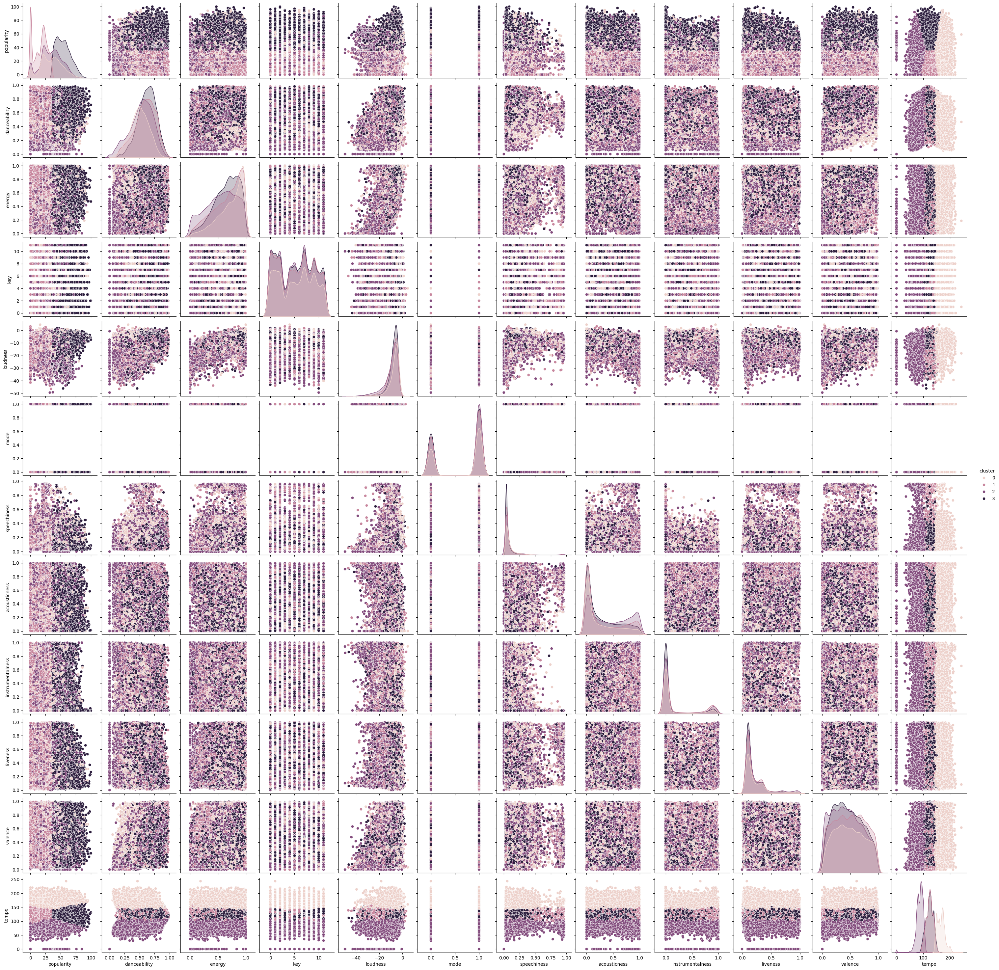

In [62]:
sns.pairplot(data=k_means_treated_train_df, hue='cluster')

<Axes: xlabel='popularity', ylabel='tempo'>

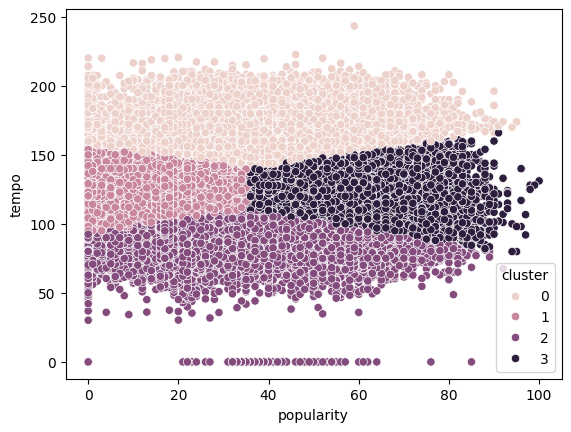

In [63]:
sns.scatterplot(data=k_means_treated_train_df, x='popularity', y='tempo', hue='cluster')

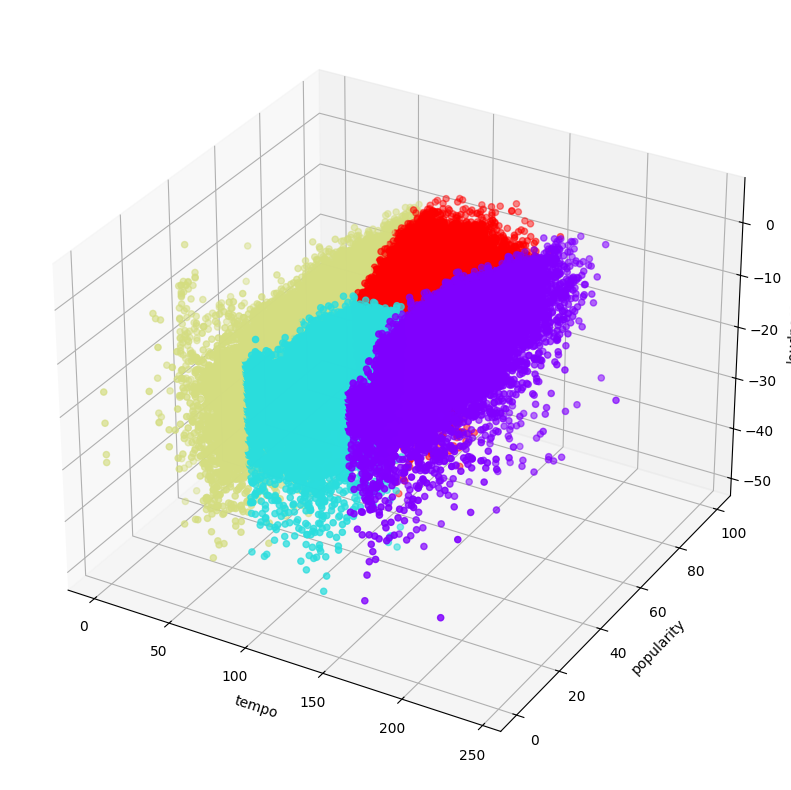

In [64]:
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(k_means_treated_train_df['tempo'], k_means_treated_train_df['popularity'], k_means_treated_train_df['loudness'], c=k_means_treated_train_df['cluster'], cmap='rainbow')
ax.set_xlabel('tempo')
ax.set_ylabel('popularity')
ax.set_zlabel('loudness')
plt.show()

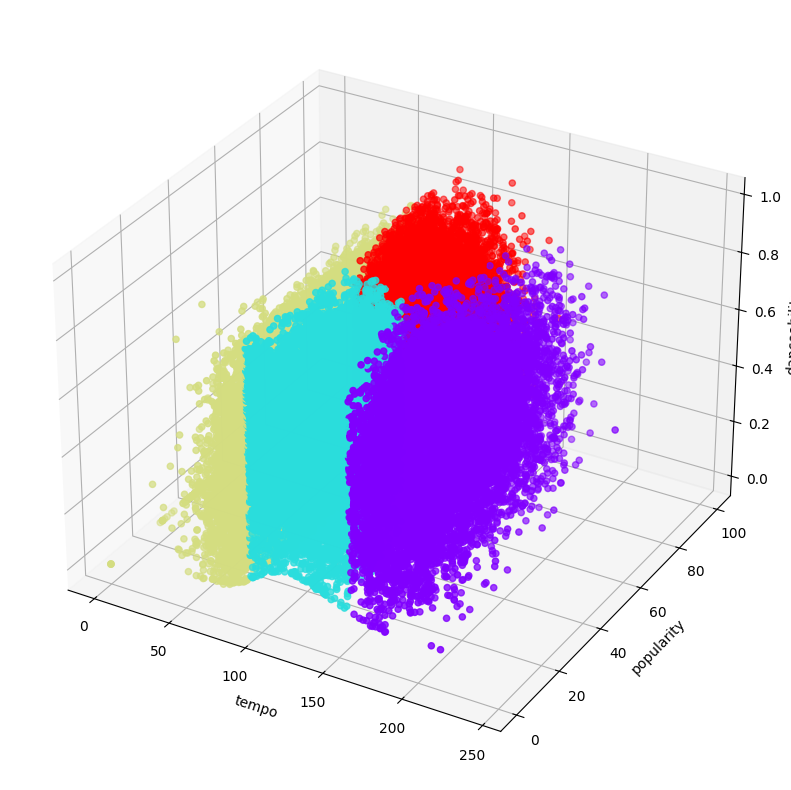

In [65]:
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(k_means_treated_train_df['tempo'], k_means_treated_train_df['popularity'], k_means_treated_train_df['danceability'], c=k_means_treated_train_df['cluster'], cmap='rainbow')
ax.set_xlabel('tempo')
ax.set_ylabel('popularity')
ax.set_zlabel('danceability')
plt.show()

> As we are able to see, songs with a higher popularity tend to have loudness closer to 0, but don't seem to be afected by danceability

In [66]:
treated_comercial_df_prediction = k_means_model.predict(treated_comercial_df)
clustered_treated_comercial_df = treated_comercial_df.copy()
clustered_treated_comercial_df['cluster'] = treated_comercial_df_prediction

In [67]:
clustered_treated_comercial_df

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,cluster
0,43.0,0.596,0.891,0.0,-5.925,0.0,0.0429,0.0350,0.000004,0.1860,0.2000,124.986,3
1,31.0,0.460,0.528,0.0,-7.249,1.0,0.0268,0.2800,0.000070,0.1310,0.4300,151.207,0
2,66.0,0.473,0.348,0.0,-11.100,1.0,0.0288,0.7210,0.000074,0.0823,0.2830,107.819,3
3,63.0,0.528,0.309,0.0,-7.398,1.0,0.0329,0.9240,0.000002,0.2820,0.3070,133.830,3
4,38.0,0.734,0.409,9.0,-7.596,1.0,0.0280,0.2460,0.000000,0.1280,0.7790,107.453,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
419948,69.0,0.407,0.147,2.0,-8.822,1.0,0.0355,0.8570,0.000003,0.0913,0.0765,141.284,3
419949,53.0,0.620,0.380,5.0,-9.320,1.0,0.0290,0.5740,0.022500,0.1080,0.2330,147.700,3
419950,35.0,0.587,0.480,6.0,-7.148,1.0,0.0330,0.3070,0.000000,0.1040,0.2690,105.814,2
419951,55.0,0.406,0.730,9.0,-6.278,1.0,0.0315,0.0471,0.000000,0.2290,0.2070,170.032,0


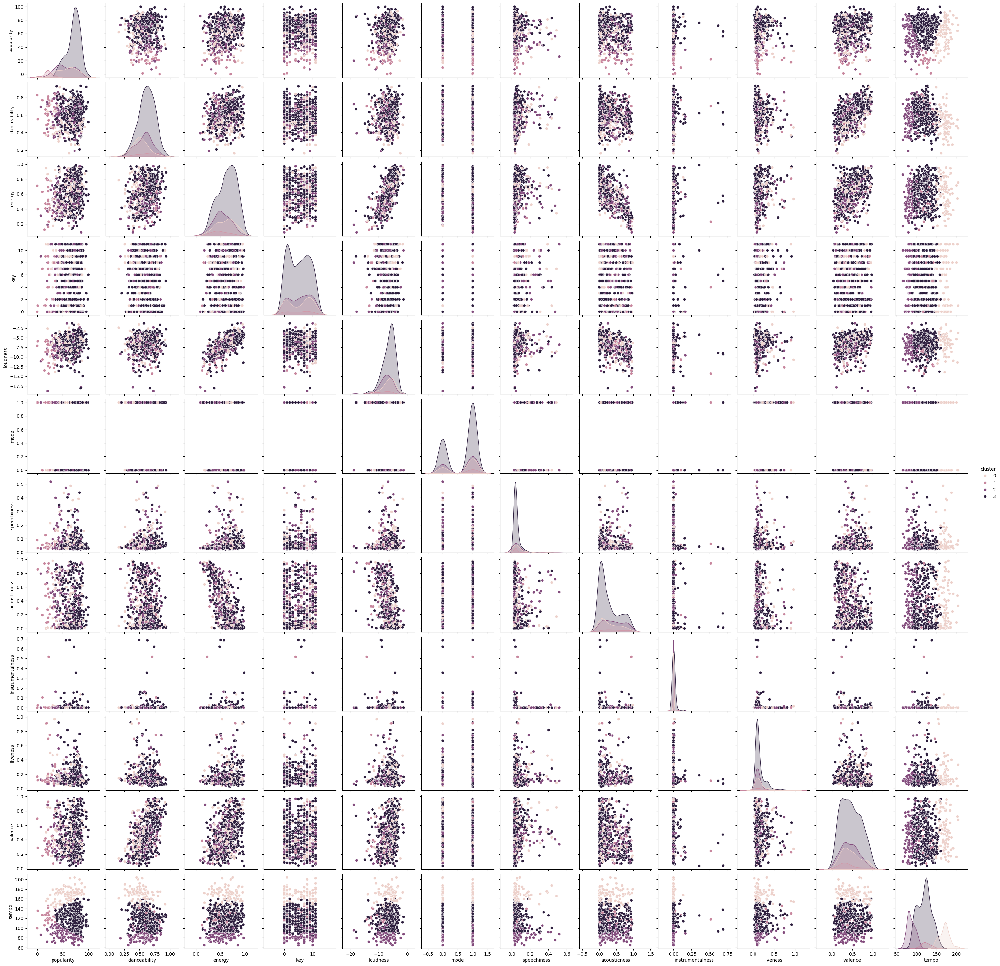

In [68]:
sns.pairplot(data=clustered_treated_comercial_df, hue='cluster')

> Now we are adding back to the df the names and artists of songs so that we can analyze the clusters

In [69]:
complete_clustered_treated_comercial_df = pd.concat([clustered_treated_comercial_df, comercial_df.iloc[clustered_treated_comercial_df.index][['artist', 'song', 'hour', 'date',]]], axis=1)
complete_clustered_treated_comercial_df

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,cluster,artist,song,hour,date
0,43.0,0.596,0.891,0.0,-5.925,0.0,0.0429,0.0350,0.000004,0.1860,0.2000,124.986,3,Years & Years,It's a Sin,00:58,01/01/2020
1,31.0,0.460,0.528,0.0,-7.249,1.0,0.0268,0.2800,0.000070,0.1310,0.4300,151.207,0,David Fonseca,Someone that Cannot Love,00:54,01/01/2020
2,66.0,0.473,0.348,0.0,-11.100,1.0,0.0288,0.7210,0.000074,0.0823,0.2830,107.819,3,Pearl Jam,Just Breathe,00:50,01/01/2020
3,63.0,0.528,0.309,0.0,-7.398,1.0,0.0329,0.9240,0.000002,0.2820,0.3070,133.830,3,"Ed Sheeran, Taylor Swift",The Joker and the Queen,00:47,01/01/2020
4,38.0,0.734,0.409,9.0,-7.596,1.0,0.0280,0.2460,0.000000,0.1280,0.7790,107.453,2,Seal,Stand by Me,00:43,01/01/2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
419948,69.0,0.407,0.147,2.0,-8.822,1.0,0.0355,0.8570,0.000003,0.0913,0.0765,141.284,3,"A Great Big World, Christina Aguilera",Say Something,23:24,27/09/2024
419949,53.0,0.620,0.380,5.0,-9.320,1.0,0.0290,0.5740,0.022500,0.1080,0.2330,147.700,3,Sade,In another Time,23:19,27/09/2024
419950,35.0,0.587,0.480,6.0,-7.148,1.0,0.0330,0.3070,0.000000,0.1040,0.2690,105.814,2,Bianca Barros,Antes da Noite Acabar,23:16,27/09/2024
419951,55.0,0.406,0.730,9.0,-6.278,1.0,0.0315,0.0471,0.000000,0.2290,0.2070,170.032,0,Dave Matthews Band,The Space Between,23:12,27/09/2024


In [70]:
complete_clustered_treated_comercial_df[complete_clustered_treated_comercial_df['cluster'] == 0]

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,cluster,artist,song,hour,date
1,31.0,0.460,0.528,0.0,-7.249,1.0,0.0268,0.2800,0.000070,0.1310,0.430,151.207,0,David Fonseca,Someone that Cannot Love,00:54,01/01/2020
10,78.0,0.597,0.450,8.0,-6.658,1.0,0.0418,0.2230,0.000000,0.3820,0.537,178.765,0,"Ariana Grande, Justin Bieber",Stuck with U,00:21,01/01/2020
37,70.0,0.325,0.472,1.0,-5.972,1.0,0.0397,0.5200,0.000000,0.3670,0.206,166.807,0,Lewis Capaldi,Love The Hell Out Of You,02:52,01/01/2020
40,58.0,0.641,0.395,3.0,-7.708,0.0,0.0512,0.8370,0.000086,0.1190,0.372,151.970,0,Ivandro,Lua,02:41,01/01/2020
45,55.0,0.485,0.839,10.0,-4.500,1.0,0.1580,0.3280,0.000000,0.0480,0.398,165.999,0,"Rihanna, Eminem",Love the Way You Lie (Part II),02:22,01/01/2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
419657,30.0,0.516,0.524,4.0,-5.427,0.0,0.0407,0.1470,0.000000,0.4660,0.409,178.569,0,"Fergie, will.i.am",All that I got (The Make Up Song),00:26,27/09/2024
419771,59.0,0.396,0.629,9.0,-4.780,1.0,0.0287,0.0328,0.000000,0.1830,0.358,173.794,0,The Script,For the First Time,07:14,27/09/2024
419847,72.0,0.794,0.711,8.0,-5.124,0.0,0.0699,0.3000,0.000000,0.0955,0.955,174.915,0,Bruno Mars,The Lazy Song,15:18,27/09/2024
419936,66.0,0.264,0.663,9.0,-8.264,1.0,0.1870,0.5900,0.004430,0.3420,0.249,167.078,0,Alicia Keys,You Don't Know My Name,22:14,27/09/2024


In [71]:
complete_clustered_treated_comercial_df[complete_clustered_treated_comercial_df['cluster'] == 1]

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,cluster,artist,song,hour,date
5,21.0,0.364,0.503,0.0,-5.923,1.0,0.0326,0.15400,0.000000,0.1250,0.3730,119.743,1,HMB,Já Não Sou Bom A Mentir,00:40,01/01/2020
21,22.0,0.540,0.387,11.0,-11.546,1.0,0.0434,0.86800,0.000455,0.0662,0.3760,126.613,1,"Miguel Carmona, Rita Rocha",Nunca Mais Vou Lá Estar,01:43,01/01/2020
57,0.0,0.829,0.711,0.0,-7.070,1.0,0.0900,0.28900,0.000032,0.1640,0.6900,99.968,1,S. Pedro,Tradição,03:43,01/01/2020
91,20.0,0.704,0.787,11.0,-6.751,0.0,0.0462,0.00926,0.005380,0.1590,0.3100,119.996,1,"Hugel, Arash, Topic, Daecolm",Adore You,05:51,01/01/2020
97,21.0,0.812,0.359,8.0,-8.591,1.0,0.0384,0.88000,0.000000,0.1430,0.5400,115.865,1,Beatriz Caixinha,A Coisa Vai Andando,05:30,01/01/2020
103,21.0,0.409,0.523,7.0,-6.366,1.0,0.0278,0.57700,0.000000,0.6950,0.1930,145.776,1,Os Quatro e Meia,Na Escola,05:10,01/01/2020
151,18.0,0.488,0.806,2.0,-5.581,1.0,0.0671,0.08270,0.001760,0.9120,0.2270,130.315,1,Xutos & Pontapés,De Madrugada (Tu & Eu),08:03,01/01/2020
356155,21.0,0.780,0.637,8.0,-5.952,0.0,0.0422,0.50500,0.000094,0.2070,0.9310,109.987,1,Leonor Arroja,Aqui,01:43,23/09/2024
356406,24.0,0.765,0.417,0.0,-12.668,0.0,0.0399,0.20500,0.000123,0.7500,0.3090,119.851,1,Pedro Abrunhosa,Viagens,22:57,23/09/2024
356414,22.0,0.705,0.229,4.0,-14.340,1.0,0.0623,0.94200,0.516000,0.1080,0.2440,117.779,1,António Zambujo,Zorro,22:28,23/09/2024


In [72]:
complete_clustered_treated_comercial_df[complete_clustered_treated_comercial_df['cluster'] == 2]

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,cluster,artist,song,hour,date
4,38.0,0.734,0.409,9.0,-7.596,1.0,0.0280,0.2460,0.000000,0.1280,0.779,107.453,2,Seal,Stand by Me,00:43,01/01/2020
7,45.0,0.622,0.571,0.0,-5.338,0.0,0.0493,0.0458,0.000000,0.1220,0.635,81.059,2,"Max, Gnash",Lights Down Low,00:33,01/01/2020
12,51.0,0.581,0.519,8.0,-6.649,1.0,0.0946,0.0137,0.000069,0.0808,0.267,83.998,2,James Arthur,Emily,00:15,01/01/2020
14,47.0,0.514,0.573,10.0,-9.093,1.0,0.2410,0.5250,0.000023,0.0942,0.355,90.046,2,"Matias Damásio, Heber",Loucos,00:08,01/01/2020
19,50.0,0.792,0.649,2.0,-8.795,1.0,0.1200,0.3580,0.000015,0.1140,0.392,96.962,2,Richie Campbell,Love Again,01:51,01/01/2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
419937,38.0,0.609,0.340,9.0,-9.675,1.0,0.0323,0.7760,0.000016,0.1040,0.246,100.093,2,Rita Rocha,Outros Planos,22:10,27/09/2024
419939,70.0,0.616,0.470,5.0,-6.092,0.0,0.0253,0.2910,0.000000,0.1110,0.325,80.030,2,Adele,Chasing Pavements,22:03,27/09/2024
419940,86.0,0.684,0.607,11.0,-8.127,0.0,0.1000,0.0267,0.000307,0.1910,0.498,81.001,2,Miguel,Sure Thing,23:58,27/09/2024
419950,35.0,0.587,0.480,6.0,-7.148,1.0,0.0330,0.3070,0.000000,0.1040,0.269,105.814,2,Bianca Barros,Antes da Noite Acabar,23:16,27/09/2024


In [73]:
complete_clustered_treated_comercial_df[complete_clustered_treated_comercial_df['cluster'] == 3]

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,cluster,artist,song,hour,date
0,43.0,0.596,0.891,0.0,-5.925,0.0,0.0429,0.03500,0.000004,0.1860,0.2000,124.986,3,Years & Years,It's a Sin,00:58,01/01/2020
2,66.0,0.473,0.348,0.0,-11.100,1.0,0.0288,0.72100,0.000074,0.0823,0.2830,107.819,3,Pearl Jam,Just Breathe,00:50,01/01/2020
3,63.0,0.528,0.309,0.0,-7.398,1.0,0.0329,0.92400,0.000002,0.2820,0.3070,133.830,3,"Ed Sheeran, Taylor Swift",The Joker and the Queen,00:47,01/01/2020
6,72.0,0.630,0.754,7.0,-5.982,1.0,0.0433,0.14800,0.000141,0.1310,0.2790,90.051,3,Olivia Dean,Dive,00:36,01/01/2020
9,74.0,0.526,0.299,8.0,-13.797,1.0,0.0310,0.94100,0.097000,0.1060,0.6790,156.848,3,Norah Jones,Sunrise,00:25,01/01/2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
419933,70.0,0.600,0.465,4.0,-4.951,1.0,0.0314,0.64300,0.000001,0.1490,0.0682,113.810,3,Zoe Wees,Control,22:25,27/09/2024
419938,71.0,0.753,0.326,7.0,-9.883,1.0,0.0342,0.73100,0.001310,0.2400,0.2370,123.799,3,John Mayer,Gravity,22:06,27/09/2024
419945,72.0,0.410,0.539,0.0,-8.412,1.0,0.0302,0.00425,0.000890,0.1170,0.1410,138.852,3,Creed,With Arms Wide Open,23:35,27/09/2024
419948,69.0,0.407,0.147,2.0,-8.822,1.0,0.0355,0.85700,0.000003,0.0913,0.0765,141.284,3,"A Great Big World, Christina Aguilera",Say Something,23:24,27/09/2024


The clusters seem to be organized by emotional tone and lyrical message. The variation between them highlights different contexts for the music, ranging from introspective and melancholic (Cluster 1) to more universal and varied emotions (Cluster 2), tranquility (Cluster 3), and optimism (Cluster 4).

| **Cluster** | **Overall Mood**         | **Main Theme**                        | **Ideal Use**                          |
|-------------|--------------------------|---------------------------------------|----------------------------------------|
| **0**       | Melancholic and deep     | Vulnerability, lost love, healing     | Relaxing and comforting moments        |
| **1**       | Varied and emotional     | Drama, lightness, emotional highs/lows| Emotional relaxation or meditation     |
| **2**       | Introspective and calm   | Reflection, overcoming, acceptance    | Introspection or processing emotions   |
| **3**       | Positive and uplifting   | Love, hope, emotional connection      | Soundtracks for diverse daily moments  |



